<div style="padding: 15px; border: 5px solid transparent; border-color: transparent; margin-bottom: 20px; border-radius: 4px; color: #3c763d; background-color: #dff0d8; border-color: #d6e9c6; font-weight: bold;">
    <br><br>
    <div style="font-weight: bold; font-size: 40px">실무에서 사용하는 인공지능 컴퓨터비전</div>
    <div style="font-weight: bold; font-size: 20px">[07-08] Face Mask Detection</div>
    <hr style="width:80%;text-align:left;margin-left:0;border:0.5px solid green">
    <br>
    &#x2022; 얼굴 영역 탐지 모델과 마스크 착용 여부 판단 모델을 결합해서 사용할 수 있다.<br>
    &#x2022; 모델 간의 입력과 출력을 이해할 수 있다. <br>
    &#x2022; 모델 적용 결과를 시각화 시킬 수 있다. <br>
</div>

<div style="padding: 15px; border: 5px solid transparent; border-color: transparent; margin-bottom: 20px; border-radius: 4px; color: #3c763d; border-color: #d6e9c6; font-weight: bold;">
<h2 style='font-weight: bold'>1. 딥러닝 모델 적용 프로세스</h2>
</div> 

### **(1) 모델 적용 결과**   

<div align='center'><a href="https://pyimagesearch.com/2020/05/04/covid-19-face-mask-detector-with-opencv-keras-tensorflow-and-deep-learning/"><button style="wid5h:100px; height:50px">Face Mask Detector with OpenCV, Keras/TensorFlow, and Deep Learning 영상 링크</button></a></div>

마스크를 쓰지 않았을 때 어떻게 되었나요? 마스크를 썼을 때 어떻게 되었나요?

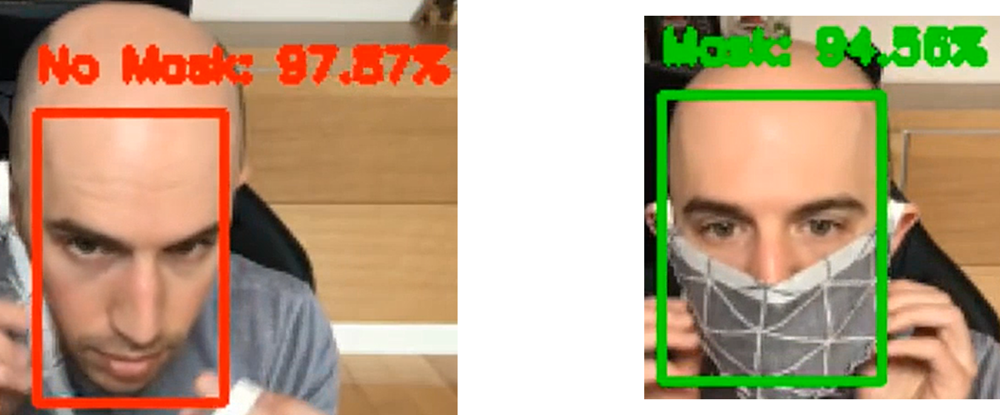


### **(2) 모델 적용 프로세스**   

Face Mask Detector를 만들기 위해서 아래와 같은 두 단계 작업이 필요합니다. 

Phase #1에서 마스크 쓴 이미지 690개, 마스크를 쓰지 않은 이미지 686개의 데이터셋을 구성하고 학습 시켜서 모델을 만들었습니다.

Phase #2에서 만들어진 모델을 불러와서 실제 이미지나 동영상에 모델을 적용해볼 수 있습니다. 

본 과정에서는 Phase #2 단계를 실습합니다. 

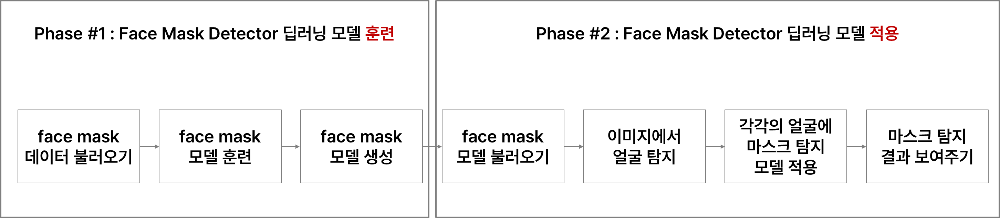

<div style="padding: 15px; border: 5px solid transparent; border-color: transparent; margin-bottom: 20px; border-radius: 4px; color: #3c763d; border-color: #d6e9c6; font-weight: bold;">
<h2 style='font-weight: bold'>2. 패키지 불러오기</h2>
</div> 

### **(1) 패키지, 모델 불러오기**   

패키지를 불러오고 모델을 로드합니다. 

```python
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
# 딥러닝 모델을 만들 때 사용하는 패키지

facenet = cv2.dnn.readNet('models/deploy.prototxt', 'models/res10_300x300_ssd_iter_140000.caffemodel')
# 얼굴 영역 탐지 모델

model = load_model('models/mask_detector.model')
# 마스크 판단 모델
```

In [ ]:
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.models import load_model
import numpy as np
import cv2

facenet = cv2.dnn.readNet('models/deploy.prototxt', 'models/res10_300x300_ssd_iter_140000.caffemodel')
model = load_model('models/mask_detector.model')


### **(2) 모델 적용의 입력과 출력**   

우리는 얼굴 영역을 탐지하는 모델과 마스크를 착용 여부 판단 모델을 사용합니다. 

얼굴 영역을 탐지하는 모델의 입력은 전체 이미지이고 모델의 출력은 얼굴 영역의 위치입니다.

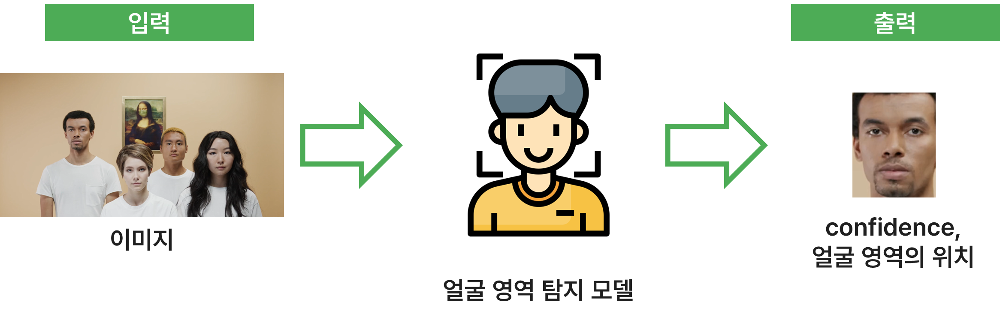

마스크 착용 여부 판단 모델의 입력은 얼굴 이미지이고, 그 얼굴에서 마스크 착용 여부에 대한 confidence를 출력합니다. 

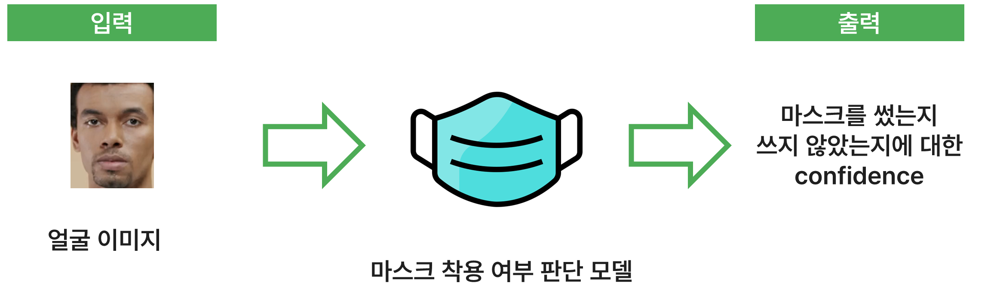

얼굴 영역 탐지 모델의 출력을 마스크 착용 여부 판단 모델의 입력으로 연결되도록 코드를 작성해보겠습니다. 

<div style="padding: 15px; border: 5px solid transparent; border-color: transparent; margin-bottom: 20px; border-radius: 4px; color: #3c763d; border-color: #d6e9c6; font-weight: bold;">
<h2 style='font-weight: bold'>3. 동영상 플레이어 만들기</h2>
</div> 

동영상을 불러오고 동영상 플레이어를 완성합니다. 

```python
cv2.VideoCapture(동영상 파일 경로)
```

In [ ]:
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.models import load_model
import numpy as np
import cv2
from ipywidgets import Image
from IPython.display import display

facenet = cv2.dnn.readNet('models/deploy.prototxt', 'models/res10_300x300_ssd_iter_140000.caffemodel')
model = load_model('models/mask_detector.model')

cap = cv2.VideoCapture('mask.mp4')
video = Image()
display(video)

while True:
    ret, img = cap.read()
    
    if ret == False:
        break

    img = cv2.imencode('.jpg', img)[1].tobytes()
    video.value = img


<div style="padding: 15px; border: 5px solid transparent; border-color: transparent; margin-bottom: 20px; border-radius: 4px; color: #3c763d; border-color: #d6e9c6; font-weight: bold;">
<h2 style='font-weight: bold'>4. 얼굴 영역 탐지</h2>
</div> 

### **(1) 얼굴 영역 탐지의 출력**   

얼굴 영역 탐지에서 최종 목표는 얼굴 영역의 (x1, y1), (x2, y2)를 알아내는 것입니다. 

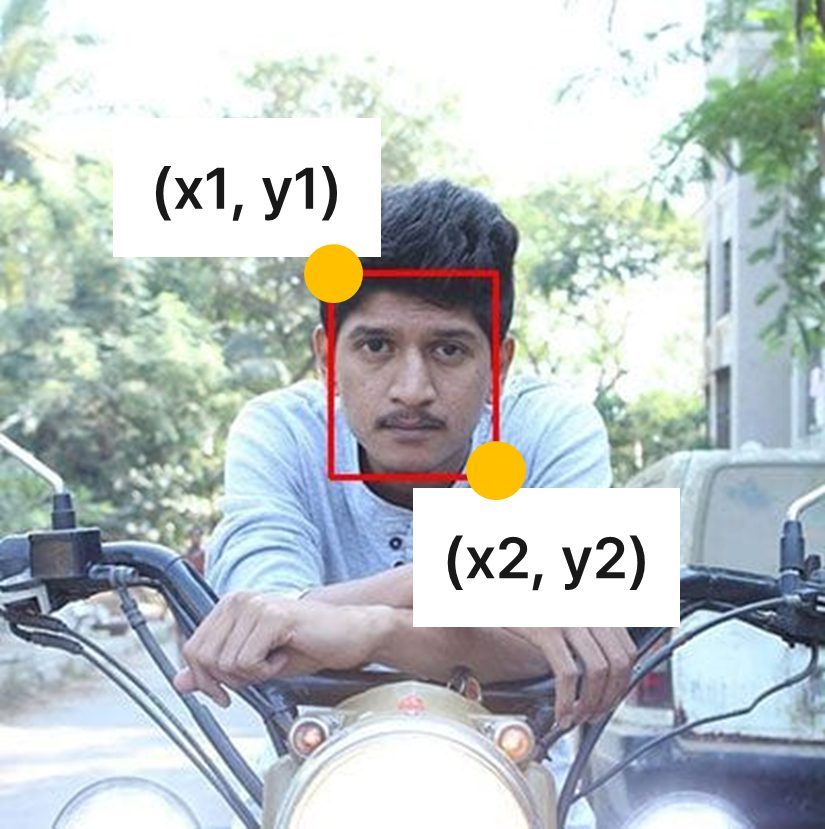

### **(2) 전처리와 추론**   

모델 적용 전 전처리와 모델을 적용하는 과정입니다. 

```python
cv2.dnn.blobFromImage(img, size=(300, 300), mean=(104., 177., 123.))
# 전처리
# 1. 차원 변경
# 2. resize
# 3. mean 값 빼기

facenet.setInput(blob)
# 추론
dets = facenet.forward()
# 얼굴 영역 탐지 결과 dets에저장
```

### **(3) 모델 추론 결과**   

딥러닝 모델이 얼굴로 짐작되는 영역과 confidence를 마구 찾아 놓습니다. 

그 중 진짜 얼굴도 있고 얼굴이 아닌 영역도 있습니다. 

우리는 confidence의 임계치를 설정하여 보여줄 얼굴을 선택할 수 있습니다. 

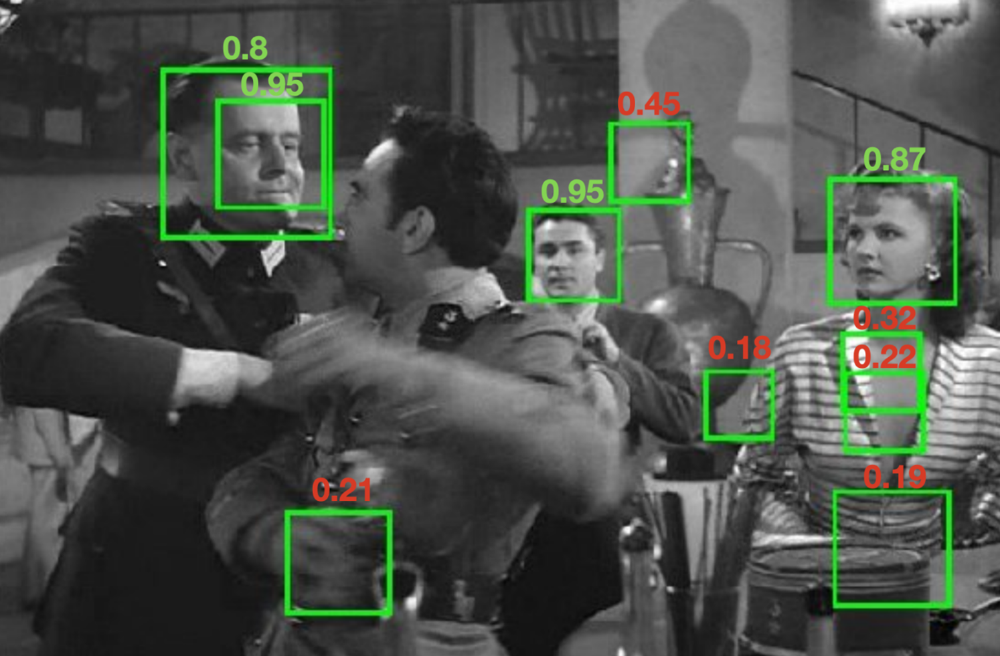

얼굴 영역이 탐지 결과가 저장된 dets 변수에서 필요한 정보를 사용합니다. 

```python

    for i in range(dets.shape[2]):
        # 한개의 화면에서 탐지한 얼굴의 갯수만큼 반복합니다. 
        
        confidence = dets[0, 0, i, 2]
        # 딥러닝 모델이 탐지한 영역이 진짜 얼굴이라고 확신하는 정도

        if confidence < 0.5:
            continue
        # 임계치를 0.5로 설정

        x1 = int(dets[0, 0, i, 3] * w)
        y1 = int(dets[0, 0, i, 4] * h)
        x2 = int(dets[0, 0, i, 5] * w)
        y2 = int(dets[0, 0, i, 6] * h)
        # 딥러닝 모델에서 얼굴 영역의 위치는 왼쪽 위를 0으로 해서 그에 대한 비율로 알려줍니다. 
        # 좌표를 알기 위해서 이미지의 width, height를 곱합니다. 

```

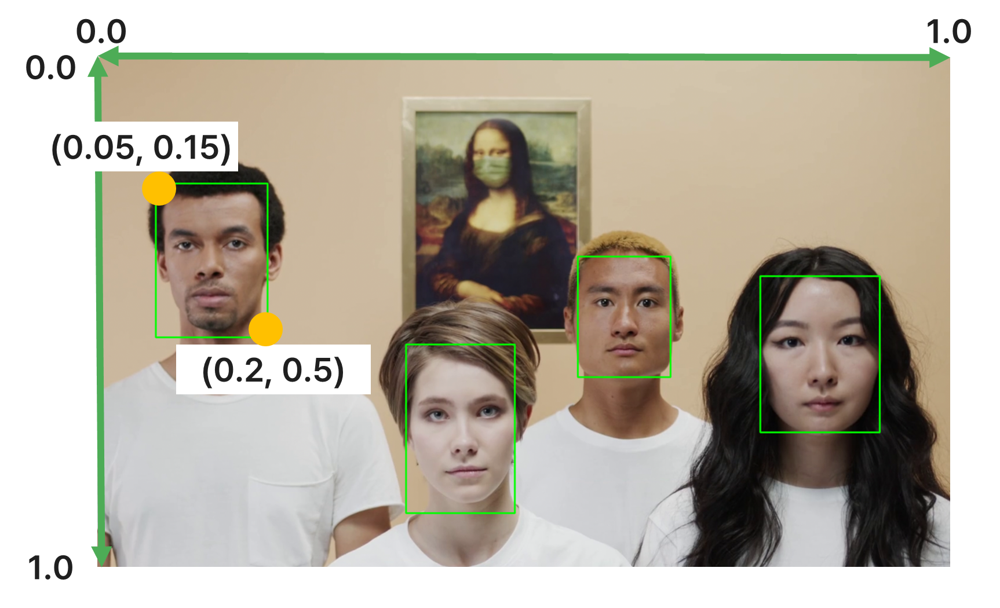

In [ ]:
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.models import load_model
import numpy as np
import cv2
from ipywidgets import Image
from IPython.display import display

facenet = cv2.dnn.readNet('models/deploy.prototxt', 'models/res10_300x300_ssd_iter_140000.caffemodel')
model = load_model('models/mask_detector.model')

cap = cv2.VideoCapture('mask.mp4')
video = Image()
display(video)

while True:
    ret, img = cap.read()
    
    if ret == False:
        break

    img = cv2.resize(img, dsize=(640, 360))
    h, w, c = img.shape
    
    blob = cv2.dnn.blobFromImage(img, size=(300, 300), mean=(104., 177., 123.))

    facenet.setInput(blob)
    dets = facenet.forward()

    for i in range(dets.shape[2]):
        
        confidence = dets[0, 0, i, 2]

        if confidence < 0.5:
            continue

        x1 = int(dets[0, 0, i, 3] * w)
        y1 = int(dets[0, 0, i, 4] * h)
        x2 = int(dets[0, 0, i, 5] * w)
        y2 = int(dets[0, 0, i, 6] * h)

        cv2.rectangle(img, pt1=(x1, y1), pt2=(x2, y2), thickness=2, color=(0, 0, 255))    
            
    img = cv2.imencode('.jpg', img)[1].tobytes()
    video.value = img       


<div style="padding: 15px; border: 5px solid transparent; border-color: transparent; margin-bottom: 20px; border-radius: 4px; color: #3c763d; border-color: #d6e9c6; font-weight: bold;">
<h2 style='font-weight: bold'>5. 마스크 착용 여부 판단</h2>
</div> 

얼굴 영역 탐지의 출력을 마스크 착용 여부 판단의 입력으로 사용하겠습니다. 

```python
        face = img[y1:y2, x1:x2]
        # 얼굴 영역 자르기

        # 전처리
        face_input = cv2.resize(face, dsize=(224, 224))
        face_input = cv2.cvtColor(face_input, cv2.COLOR_BGR2RGB)
        face_input = preprocess_input(face_input)
        # preprocess_input() tensorflow에서 특정 모델의 전처리 함수를 편하게 사용하도록 모아놓은 모듈
        face_input = np.expand_dims(face_input, axis=0) 
        # 차원 변형 (224, 224, 3) -> (1, 224, 224, 3)

        # 결과 추론하기
        mask, nomask = model.predict(face_input).squeeze()
        # make : 마스크를 쓴 confidence
        # nomask : 마스크를 쓰지 않은 confidence
        # predict() : OpenCV에서 forward와 같은 함수
        # squeeze() : 차원을 줄여주는 함수
        
```

마스크를 쓴 사람은 초록색으로 얼굴을 표시하고, 마스크를 쓰지 않은 사람은 빨간색으로 얼굴을 표시합니다. 

```python
        if mask > nomask:
            color = (0, 255, 0)
        else:
            color = (0, 0, 255)
            
        cv2.rectangle(img, pt1=(x1, y1), pt2=(x2, y2), thickness=2, color=color)    
```

In [ ]:
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.models import load_model
import numpy as np
import cv2
from ipywidgets import Image
from IPython.display import display

facenet = cv2.dnn.readNet('models/deploy.prototxt', 'models/res10_300x300_ssd_iter_140000.caffemodel')
model = load_model('models/mask_detector.model')

cap = cv2.VideoCapture('mask.mp4')
video = Image()
display(video)

while True:
    ret, img = cap.read()
    
    if ret == False:
        break

    img = cv2.resize(img, dsize=(640, 360))
    h, w, c = img.shape
    
    blob = cv2.dnn.blobFromImage(img, size=(300, 300), mean=(104., 177., 123.))

    facenet.setInput(blob)
    dets = facenet.forward()
    
    for i in range(dets.shape[2]):
        confidence = dets[0, 0, i, 2]

        if confidence < 0.5:
            continue

        x1 = int(dets[0, 0, i, 3] * w)
        y1 = int(dets[0, 0, i, 4] * h)
        x2 = int(dets[0, 0, i, 5] * w)
        y2 = int(dets[0, 0, i, 6] * h)

        face = img[y1:y2, x1:x2]

        face_input = cv2.resize(face, dsize=(224, 224))
        face_input = cv2.cvtColor(face_input, cv2.COLOR_BGR2RGB)
        face_input = preprocess_input(face_input)
        face_input = np.expand_dims(face_input, axis=0) 
        mask, nomask = model.predict(face_input).squeeze()
        
        if mask > nomask:
            color = (0, 255, 0)
        else:
            color = (0, 0, 255)
            
        cv2.rectangle(img, pt1=(x1, y1), pt2=(x2, y2), thickness=2, color=color)    
            
    img = cv2.imencode('.jpg', img)[1].tobytes()
    video.value = img
        


<div style="padding: 15px; border: 5px solid transparent; border-color: transparent; margin-bottom: 20px; border-radius: 4px; color: #8a6d3b;  border-color: #faebcc; font-weight: bold;">
    <div style="font-weight: bold; font-size: 20px">✏️ [미션1]</div>
    <br>
    아래 미션을 완성하세요.<br><br>
    1. 윈도우의 카메라 앱과 웹캠을 이용해서 자신의 얼굴이 나오는 10초 이내의 영상을 촬영합니다. <br>
2. 영상을 촬영할 때 마스크를 쓴 얼굴과 쓰지 않은 얼굴이 모두 나오게 촬영하세요.(마스크가 없다면 다른 것으로 마스크를 대신해도 좋습니다.)<br>
3. 촬영한 영상으로 실습 코드를 적용시켜보세요. <br>
</div>

<div style="padding: 15px; border: 5px solid transparent; border-color: transparent; margin-bottom: 20px; border-radius: 4px; color: #3c763d; border-color: #d6e9c6; font-weight: bold;">
<h2 style='font-weight: bold'>6. confidence 표시하기</h2>
</div> 

아래처럼 얼굴 영역에 마스크를 썼는지 여부와 confidence를 표시해봅시다. 


```python
cv2.putText(이미지, text=텍스트, org=위치 좌표, fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.8, color=글자색, thickness=2)
```

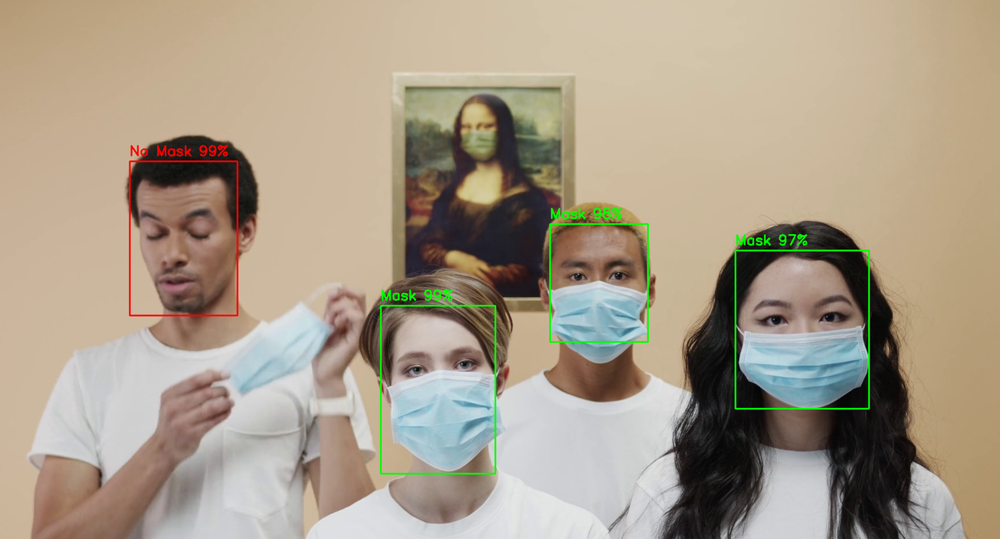

In [ ]:
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.models import load_model
import numpy as np
import cv2
from ipywidgets import Image
from IPython.display import display

facenet = cv2.dnn.readNet('models/deploy.prototxt', 'models/res10_300x300_ssd_iter_140000.caffemodel')
model = load_model('models/mask_detector.model')

cap = cv2.VideoCapture('mask.mp4')
video = Image()
display(video)

while True:
    ret, img = cap.read()
    
    if ret == False:
        break

    img = cv2.resize(img, dsize=(640, 360))
    h, w, c = img.shape
    
    blob = cv2.dnn.blobFromImage(img, size=(300, 300), mean=(104., 177., 123.))

    facenet.setInput(blob)
    dets = facenet.forward()
    
    for i in range(dets.shape[2]):
        confidence = dets[0, 0, i, 2]

        if confidence < 0.5:
            continue

        x1 = int(dets[0, 0, i, 3] * w)
        y1 = int(dets[0, 0, i, 4] * h)
        x2 = int(dets[0, 0, i, 5] * w)
        y2 = int(dets[0, 0, i, 6] * h)

        face = img[y1:y2, x1:x2]

        face_input = cv2.resize(face, dsize=(224, 224))
        face_input = cv2.cvtColor(face_input, cv2.COLOR_BGR2RGB)
        face_input = preprocess_input(face_input)
        face_input = np.expand_dims(face_input, axis=0) 
        mask, nomask = model.predict(face_input).squeeze()
        
        if mask > nomask:
            color = (0, 255, 0)
            label = 'Mask %d%%' % (mask * 100)
        else:
            color = (0, 0, 255)
            label = 'No Mask %d%%' % (nomask * 100)
            
        cv2.rectangle(img, pt1=(x1, y1), pt2=(x2, y2), thickness=2, color=color)    
        cv2.putText(img, text=label, org=(x1, y1 - 10), fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=0.5, color=color, thickness=2)
            
    img = cv2.imencode('.jpg', img)[1].tobytes()
    video.value = img
    


<div style="padding: 15px; border: 5px solid transparent; border-color: transparent; margin-bottom: 20px; border-radius: 4px; color: #8a6d3b;  border-color: #faebcc; font-weight: bold;">
    <div style="font-weight: bold; font-size: 20px">✏️ [미션2]</div>
    <br>
    자신의 얼굴 영상에 마스크 판단 confidence를 표시해주세요.
</div>